In [1]:
import os
os.chdir(path='../../')
import scanpy as sc
import plotly.express as px
import matplotlib.pyplot as plt
import STForte.helper as stfhelper
sc.set_figure_params(dpi=120, transparent=True, dpi_save=400, frameon=False, vector_friendly=False, format="pdf", fontsize=16)
trial_name = "trial-DLPFC-pca/151673"
palette = px.colors.qualitative.Plotly
plot_dir = f"./{trial_name}/plots"
sc.settings.figdir = plot_dir
plt.rcParams['font.sans-serif'] = [
    'Helvetica',
    'Arial',
    'sans-serif',]

Global seed set to 0


In [2]:
adata = sc.read_h5ad(f"./{trial_name}/outputs/stforte.h5ad")
adata

AnnData object with n_obs × n_vars = 3639 × 33538
    obs: 'in_tissue', 'array_row', 'array_col', 'spatialLIBD', 'STForte_Mask', 'mclust_STForte_COMB'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'mclust_STForte_COMB_colors', 'neighbors', 'spatial', 'spatialLIBD_colors', 'umap'
    obsm: 'STForte_ATTR', 'STForte_COMB', 'STForte_TOPO', 'X_umap', 'spatial'
    obsp: 'connectivities', 'distances'

In [3]:
adata_sp = sc.read_h5ad(f"./{trial_name}/outputs/sp.h5ad")
adata_sp

AnnData object with n_obs × n_vars = 14201 × 300
    obs: 'spot_instance', 'mclust_STForte_COMB_with_padding', 'spatialLIBD_with_padding'
    uns: 'mclust_STForte_COMB_with_padding_colors', 'neighbors', 'spatialLIBD_with_padding_colors', 'spot_instance_colors', 'umap'
    obsm: 'SP_ATTR_FP', 'SP_COMB', 'SP_TOPO', 'X_umap', 'spatial'
    obsp: 'A_STForte_conn', 'A_STForte_recon', 'connectivities', 'distances'

In [4]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

In [5]:
gene_names = ["MOBP", # WM; Cluster-3,2
              "GFAP", # WM, L1
              "TBR1", # L6; Cluster-7
              "PCP4", # L5(L4); Cluster-5
              "NEFH", # L3; Cluster-1
              "CALB1", # L2; Cluster-6
              "RELN", # L1; Cluster-4
              "SNAP25", # L1-L6
              ]
marker_palette = dict(map(lambda k, v: (k, v), adata.obs["mclust_STForte_COMB"].cat.categories.astype(str), adata.uns['mclust_STForte_COMB_colors']))
adata.obs["mclust_STForte_COMB_temp"] = adata.obs['mclust_STForte_COMB'].cat.reorder_categories([2, 3, 5, 1, 7, 6, 4]).cat.rename_categories(lambda i : str(i))
fig = stfhelper.pl.plot_trend_genes(adata, gene_names, 
                                    group="mclust_STForte_COMB_temp",
                                    marker_palette=marker_palette,
                                    line_color="#333333")
fig.update_layout(
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor="#F8F8FF",
    title=None,
    template='plotly_white', width=220, height=500, 
    showlegend=False,)
fig.update_layout(margin=dict(l=16, r=2, b=2, t=16, pad=2),
                  font_family="Arial", font_size=16)
fig.update_yaxes(title_font_size=14)
for ii in range(len(gene_names)):
    if ii != len(gene_names) - 1:
        fig.update_xaxes(tickson="boundaries",row=ii+1, col=1)
    else:    
        fig.update_xaxes(ticks="outside", tickson="boundaries", ticklen=10, tickcolor="#aaaaaa",row=8, col=1)
fig.write_image(f"./{trial_name}/plots/trend_markergene.pdf")
fig.show()

Relative Genes for reference:
- MOBP (WM): 
    - [Myelin-Associated Oligodendrocytic Basic Protein: A Family of Abundant CNS Myelin Proteins in Search of a Function](https://doi.org/10.1159/000095110)
- GFAP (WM, L1): 
    - [Distribution of Glial Fibrillary Acidic Protein in Gliosed Human White Matter](https://doi.org/10.1111/j.1471-4159.1986.tb13079.x)
    - [Interlaminar astroglia of the cerebral cortex: a marker of the primate brain](https://doi.org/10.1016/j.brainres.2004.02.003)
- TBR1 (L6): 
    - [Neonatal Tbr1 Dosage Controls Cortical Layer 6 Connectivity](https://doi.org/10.1016/j.neuron.2018.09.027)
- PCP4 (L5): 
    - [Molecular analysis of neocortical layer structure in the ferret](https://doi.org/10.1002/cne.22399)
- NEFH (L3) 
    - [Large-Scale Cellular-Resolution Gene Profiling in Human Neocortex Reveals Species-Specific Molecular Sigene_nameatures](https://doi.org/10.1016/j.cell.2012.02.052)
- CALB1 (L2) 
    -[Layer-specific markers as probes for neuron type identity in human neocortex and malformations of cortical development](https://doi.org/10.1097/nen.0b013e3180301c06)
    - [Interneuron Diversity in Layers 2–3 of Monkey Prefrontal Cortex](https://doi.org/10.1093/cercor/bhn198)
- RELN (L1) 
    - [Layer-specific markers as probes for neuron type identity in human neocortex and malformations of cortical development](https://doi.org/10.1097/nen.0b013e3180301c06)
    - [RELN-expressing neuron density in layer I of the superior temporal lobe is similar in human brains with autism and in age-matched controls](https://doi.org/10.1016/j.neulet.2014.07.031)

/tmp/ipykernel_10000/2692638005.py:13: MatplotlibDeprecationWarning:

Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.



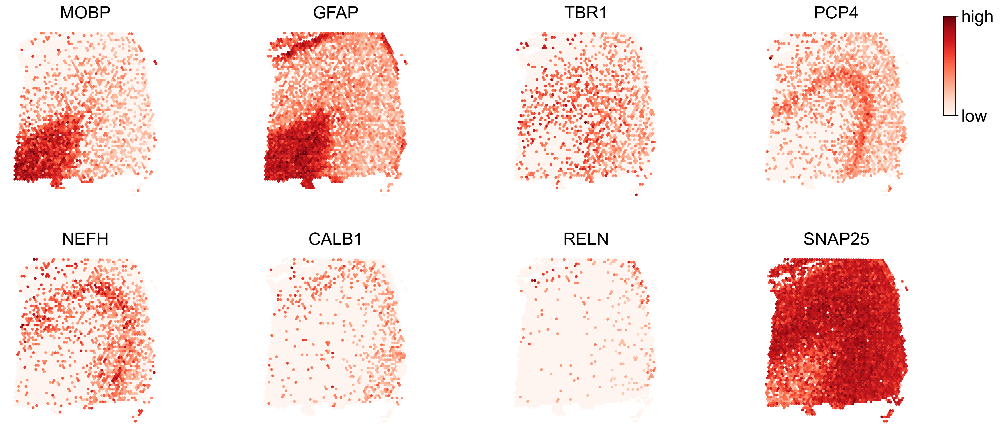

In [6]:
cmap = plt.cm.Reds
sc.set_figure_params(dpi=120, transparent=True, dpi_save=400, frameon=False, vector_friendly=False, format="pdf", fontsize=20)
with plt.rc_context():
    fig = sc.pl.spatial(adata, color=gene_names, ncols=4, alpha_img=0.0,
                         color_map=cmap, vmin=0,
                         frameon=False, 
                         colorbar_loc=None,
                         img_key="hires", size=1.6,
                         show=False,
                         return_fig=True,
                        )
    cax = plt.axes([0.85, 0.7, 0.01, 0.2])
    cbar = plt.colorbar(plt.cm.ScalarMappable(cmap=stfhelper.pl.colormap_with_alpha(cmap)), cax=cax, ticks=[0, 1])
    cbar.ax.set_yticklabels(["low", "high"])
    plt.savefig(f"{plot_dir}/show_markergenes.pdf", bbox_inches="tight", dpi=400)

In [7]:
stfhelper.complete_unseen_expression(adata_sp, gene_names, adata)

Propagating genes...:   0%|          | 0/8 [00:00<?, ?it/s]

/tmp/ipykernel_10000/2574247572.py:14: MatplotlibDeprecationWarning:

Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.



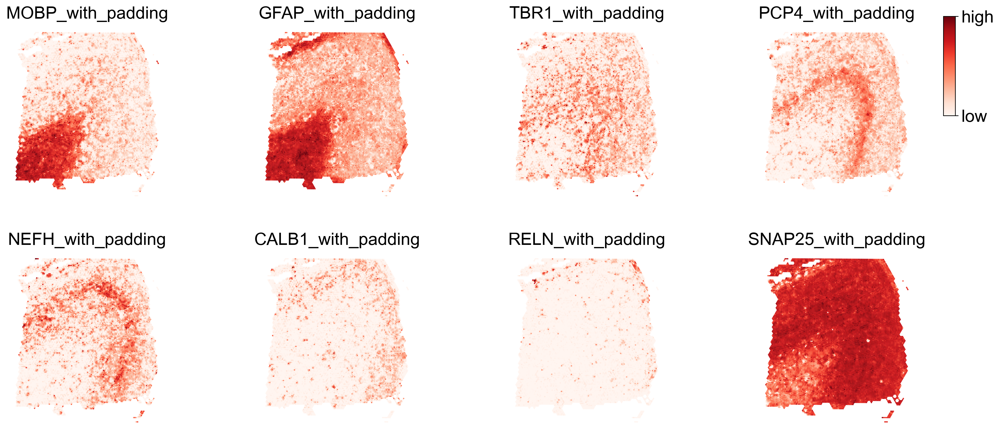

In [8]:
with plt.rc_context():
    sc.pl.spatial(adata_sp, color=list(map(lambda s: s + "_with_padding", gene_names)), size=0.8,
                  color_map=cmap, vmin=0,
                  ncols=4, alpha_img=0.0,
                  # title=[""] * 5,
                  frameon=False, colorbar_loc=None,
                  img=adata.uns['spatial']['stomic']['images']['hires'],
                  spot_size=adata.uns['spatial']['stomic']['scalefactors']['spot_diameter_fullres'], 
                  scale_factor=adata.uns['spatial']['stomic']['scalefactors']['tissue_hires_scalef'],
                  show=False,
                  return_fig=True,
                )
    cax = plt.axes([0.85, 0.7, 0.01, 0.2])
    cbar = plt.colorbar(plt.cm.ScalarMappable(cmap=stfhelper.pl.colormap_with_alpha(cmap)), cax=cax, ticks=[0, 1])
    cbar.ax.set_yticklabels(["low", "high"])
    plt.savefig(f"{plot_dir}/show_sp_markergenes.pdf", bbox_inches="tight", dpi=400)

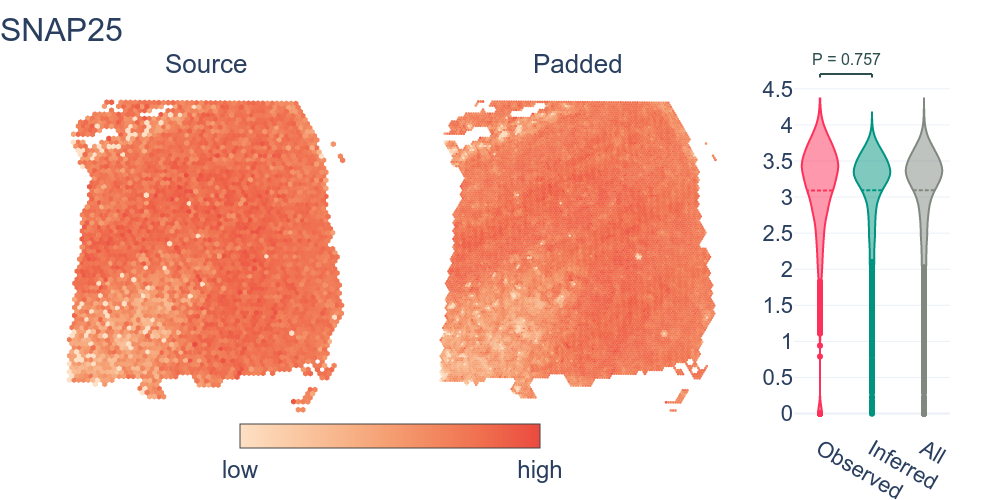

In [9]:
geneplot_dir = f"./{trial_name}/plots/genes"
if not os.path.exists(geneplot_dir):
    os.makedirs(geneplot_dir)
for gn in gene_names:
    fig = stfhelper.pl.compare_unseen_expression(adata, adata_sp, gn)
    fig = stfhelper.pl.add_p_value_annotation(fig, [[0, 1]], subplot=3)
    fig.update_layout(margin=dict(l=50,r=50,b=50,t=100), title=dict(x=0.00))
    fig.write_image(f"{geneplot_dir}/{gn}.pdf")
stfhelper.pl.show_static_figure(fig)

In [10]:
fig = stfhelper.pl.compare_unseen_expression(adata, adata_sp, "GFAP")
fig = stfhelper.pl.add_p_value_annotation(fig, [[0, 1]], subplot=3)
fig.update_layout(margin=dict(l=50,r=50,b=50,t=100), title=dict(x=0.00))
fig.update_layout(font_size=24, font_family="Arial",
                    title=dict(text="GFAP", font=dict(size=32), yref='paper', x=0.1),)
fig